# FLUXNET-CH4  (spin_up_80yr)

## Copy the restart data from CRUJRA

In [ ]:
import os
import glob

path1 = '/share/home/dq076/data/cases/site/CRUJRA/spin_up_80yr'
path2 = '/share/home/dq076/data/cases/site/FLUXNET-CH4/spin_up_80yr'
nml_files = glob.glob(f'{path1}/*')
print(nml_files)
nml_names = [os.path.basename(nml_file) for nml_file in nml_files]
os.makedirs(f'{path2}',exist_ok=True)
for name in nml_names:
    print(name)
    # os.makedirs(f'{path2}/{name}',exist_ok=True)
    os.makedirs(f'{path2}/{name}/history',exist_ok=True)
    os.system(f'cp -r {path1}/{name}/landdata {path1}/{name}/restart {path2}/{name}/')

## 1.Make the nml

In [ ]:
import itertools
import os
import subprocess
import glob, os, shutil, sys
import numpy as np
import pandas as pd
import xarray as xr
import time

list1 = []
list2 = []
list3 = []
def make_namelist(nml_input,nml_output,station_list,mode='no_spin_up',forcing='FLUXNET-CH4'):
    # open nml file and readlines
    with open(nml_input+'US-Los_FLUXNET-CH4_spin_up_80yr.nml', 'r') as file:
        nml_content = file.readlines()

    path= '/share/home/dq076/data/ME/FLUXNET-CH4/'
    site = f'FLX_{station_list['SITE_ID']}_FLUXNET-CH4_{station_list['YEAR_START']}-{station_list['YEAR_END']}_1-1'
    hh_name = f'FLX_{station_list['SITE_ID']}_FLUXNET-CH4_HH_{station_list['YEAR_START']}-{station_list['YEAR_END']}_1-1.csv'
    name = f"{path}{site}/{hh_name}"
    df = pd.read_csv(name, header=0)

    if df['TIMESTAMP_START'].iloc[0].astype(str)[:4] == str(station_list['YEAR_START']):
        start = str(df['TIMESTAMP_START'].iloc[0])
        end = str(df['TIMESTAMP_START'].iloc[-1])
    else:
        start = str(df['TIMESTAMP_END'].iloc[0])
        end = str(df['TIMESTAMP_END'].iloc[-1])
    start_year = int(start[0:4])
    start_mon = int(start[4:6])
    start_day = int(start[6:8])
    start_second = int(start[8:10])*3600+int(start[10:12])*60
    end_second = int(end[8:10])*3600+int(end[10:12])*60

    generate_nml = True
    if start_mon == 1 and start_day==1 and start_second==0:
        list1.append(station_list['SITE_ID'])
    elif start_year+1<=int(station_list['YEAR_END']):
        list2.append(station_list['SITE_ID'])
        start_year = start_year+1
        start_mon = 1
        start_day = 1
        start_second = 0
    else:
        list3.append(station_list['SITE_ID'])
        generate_nml = False  
    
    if generate_nml:
        for i, line in enumerate(nml_content):
            if 'DEF_CASE_NAME' in line:
                nml_content[i] = f"DEF_CASE_NAME = '{station_list['SITE_ID']}'\n"
            if 'DEF_simulation_time%start_year' in line:
                nml_content[i] = f"DEF_simulation_time%start_year = {start_year}\n"
            if 'DEF_simulation_time%start_month' in line:
                nml_content[i] = f"DEF_simulation_time%start_month = {start_mon}\n"
            if 'DEF_simulation_time%start_day' in line:
                nml_content[i] = f"DEF_simulation_time%start_day = {start_day}\n"
            if 'DEF_simulation_time%start_sec' in line:
                nml_content[i] = f"DEF_simulation_time%start_sec = {start_second}\n"
            if 'DEF_simulation_time%end_year' in line:
                nml_content[i] = f"DEF_simulation_time%end_year = {str(station_list['YEAR_END'])}\n"
            if 'DEF_simulation_time%end_month' in line:
                nml_content[i] = f"DEF_simulation_time%end_month = {int(end[4:6])}\n"
            if 'DEF_simulation_time%end_day' in line:
                nml_content[i] = f"DEF_simulation_time%end_day = {int(end[6:8])}\n"
            if 'DEF_simulation_time%end_sec' in line:
                nml_content[i] = f"DEF_simulation_time%end_sec = {end_second}\n"
            if 'DEF_simulation_time%spinup_year' in line:
                nml_content[i] = f"DEF_simulation_time%spinup_year = {int(station_list['YEAR_START']) - 1}\n"
            if 'SITE_fsitedata' in line:
                nml_content[i] = f"SITE_fsitedata = '{station_list['srfpath']}'\n"
            if 'DEF_dir_output' in line:
                nml_content[i] = f"DEF_dir_output = '/share/home/dq076/data/cases/site/{forcing}/{mode}/'\n"
            if 'DEF_forcing_namelist' in line:
                nml_content[i] = f"DEF_forcing_namelist = '{nml_input}/site/{forcing}/forcing/SINGLE_{station_list['SITE_ID']}.nml'\n"

        new_file_path = f"{nml_output}{station_list['SITE_ID']}.nml"
        with open(new_file_path, 'w') as file:
            file.writelines(nml_content)

if __name__ == '__main__':
    forcing ='FLUXNET-CH4'
    mode='spin_up_80yr'

    stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    n = len(station_lists['SITE_ID'])
    nml_input = "/share/home/dq076/mode/ME/CoLM202X_CH4_s/run/"
    nml_output = f"{nml_input}site/{forcing}/{mode}/"
    os.makedirs(nml_output, exist_ok=True)
    for i in range(n):
        station_list = station_lists.iloc[i]
        station_list['srfpath'] = f'/share/home/dq076/data/CoLM_Forcing/PLUMBER2/Srfdata/{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Srf.nc'     
        make_namelist(nml_input,nml_output,station_list,mode,forcing)
    print(list1)
    print(list2)
    print(list3)

## 2.Run the CoLM (without mksrf and mkini)

In [ ]:
import subprocess
import os
from joblib import Parallel, delayed
import glob
from concurrent.futures import ProcessPoolExecutor, as_completed  # 切换到 ProcessPoolExecutor 以支持实时进度

def load_environment(env_file):
    cmd = f'bash -c "source {env_file} && env"'
    result = subprocess.run(cmd, shell=True, capture_output=True, text=True)
    
    new_env = {}
    for line in result.stdout.strip().split('\n'):
        if '=' in line:
            key, value = line.split('=', 1)
            if not key.startswith('BASH_FUNC_'):
                new_env[key] = value
    
    os.environ.update(new_env)
    return os.environ.copy()

def run_colm(run_path, nml_path, log_path, nml_name, updated_env):
    """
    处理单个 nml 文件，返回成功/失败状态（不打印进度，由主脚本处理）。
    """
    nml_file = f'{nml_path}{nml_name}.nml'
    log_file = f'{log_path}{nml_name}.txt'
    
    try:
        # 用 'w' 模式打开文件，重置内容
        with open(log_file, 'w', encoding='utf-8') as log:
            log.write(f"=== 处理 {nml_name}.nml ===\n")
            log.flush()
            
            commands = [
                # [f'{run_path}mksrfdata.x', nml_file],
                # [f'{run_path}mkinidata.x', nml_file],
                [f'{run_path}colm.x', nml_file]
            ]
            
            for cmd in commands:
                log.write(f"执行命令: {' '.join(cmd)}\n")
                log.flush()
                
                subprocess.run(cmd, 
                               env=updated_env, 
                               stdout=log, 
                               stderr=subprocess.STDOUT, 
                               text=True)
                
                log.write("\n" + "="*50 + "\n")
                log.flush()
            
            log.write(f"=== {nml_name} 处理完成 ===\n")
            log.flush()
        
        return True  # 成功
    except Exception as e:
        # 如果失败，也记录到日志
        with open(log_file, 'w', encoding='utf-8') as log:
            log.write(f"=== {nml_name}.nml 处理失败: {str(e)} ===\n")
        return False

if __name__ == "__main__":
    forcing ='FLUXNET-CH4'
    mode ='spin_up_80yr'

    env_file = '/share/home/dq089/soft/gnu-env'
    run_path = '/share/home/dq076/mode/ME/CoLM202X_CH4_s/run/'

    nml_path = f'{run_path}site/{forcing}/{mode}/'
    log_path = f'{nml_path}logs/'  
    os.makedirs(log_path, exist_ok=True)

    updated_env = load_environment(env_file)
    nml_files = glob.glob(f'{nml_path}*.nml')
    nml_names = [os.path.splitext(os.path.basename(nml_file))[0] for nml_file in nml_files]
    print(f"发现 {len(nml_files)} 个 .nml 文件：{nml_names}")
    
    # 切换到 ProcessPoolExecutor 以支持 as_completed 实时进度
    max_workers = min(24, os.cpu_count() or 1)
    with ProcessPoolExecutor(max_workers=max_workers) as executor:
        # 提交所有任务，返回 future 对象
        future_to_nml = {
            executor.submit(run_colm, run_path, nml_path, log_path, nml_name, updated_env): nml_name
            for nml_name in nml_names
        }
        
        # 维护剩余任务集合
        remaining_nml = set(nml_names)
        completed_count = 0
        
        # 实时监控完成
        for future in as_completed(future_to_nml):
            nml_name = future_to_nml[future]
            try:
                success = future.result()
                if success:
                    completed_count += 1
                remaining_nml.discard(nml_name)  # 移除已完成（无论成功/失败）
                
                # 打印进度：总数 + 剩余列表
                print(f"=== {nml_name} 处理完成（成功: {success}) ===")
                print(f"已完成总数: {completed_count}/{len(nml_names)}")
                if remaining_nml:
                    print(f"剩余未处理: {sorted(list(remaining_nml))}")
                else:
                    print("所有任务已完成！")
                print("-" * 50)
                
            except Exception as exc:
                print(f"{nml_name} 执行异常: {exc}")
                remaining_nml.discard(nml_name)
                completed_count += 1  # 视作完成（失败）
                print(f"已完成总数: {completed_count}/{len(nml_names)}")
                if remaining_nml:
                    print(f"剩余未处理: {sorted(list(remaining_nml))}")
                print("-" * 50)
    
    print("批量处理结束。")

发现 79 个 .nml 文件：['US-Tw1', 'US-Tw4', 'US-Uaf', 'ID-Pag', 'US-MRM', 'HK-MPM', 'CH-Cha', 'US-HRA', 'US-ICs', 'FI-Lom', 'US-EML', 'KR-CRK', 'IT-Cas', 'CH-Dav', 'FI-Si2', 'US-LA2', 'US-LA1', 'US-Tw5', 'JP-Mse', 'US-Myb', 'AT-Neu', 'US-NGC', 'US-EDN', 'MY-MLM', 'RU-Ch2', 'DE-Dgw', 'US-ORv', 'DE-SfN', 'US-BZS', 'US-CRT', 'US-A10', 'US-StJ', 'US-Sne', 'US-DPW', 'CA-SCB', 'RU-Cok', 'PH-RiF', 'FR-LGt', 'US-NGB', 'CA-SCC', 'US-Snd', 'RU-Che', 'NZ-Kop', 'US-Bi2', 'BW-Gum', 'US-Srr', 'US-Tw3', 'US-Ho1', 'BR-Npw', 'JP-SwL', 'JP-BBY', 'US-Pfa', 'US-BZF', 'DE-Hte', 'FI-Hyy', 'US-A03', 'US-Los', 'US-Bi1', 'US-Ivo', 'US-Bes', 'RU-Fy2', 'US-MAC', 'US-Twt', 'US-WPT', 'US-BZB', 'US-HRC', 'NL-Hor', 'CH-Oe2', 'DE-Zrk', 'CN-Hgu', 'US-Beo', 'US-NC4', 'BW-Nxr', 'IT-BCi', 'SE-Deg', 'US-OWC', 'FI-Sii', 'US-Atq', 'UK-LBT']
=== ID-Pag 处理完成（成功: True) ===
已完成总数: 1/79
剩余未处理: ['AT-Neu', 'BR-Npw', 'BW-Gum', 'BW-Nxr', 'CA-SCB', 'CA-SCC', 'CH-Cha', 'CH-Dav', 'CH-Oe2', 'CN-Hgu', 'DE-Dgw', 'DE-Hte', 'DE-SfN', 'DE-Zrk', 'FI

## 3.Postprocess

In [1]:
import glob
import os
from joblib import Parallel, delayed
import pandas as pd

def merge(i,station_lists,data_path):
    station_list = station_lists.iloc[i]
    case = station_list['SITE_ID']
    yrstt = station_list['YEAR_START']
    yrend = station_list['YEAR_END']
    history_path = f'{data_path}/{case}/history/'
    postdata_path = f'{data_path}/{case}/postdata/'
    postdata_name = f'{case}_hist_{yrstt}-{yrend}.nc'
    os.makedirs(postdata_path,exist_ok=True)

    nc_files = [f for f in os.listdir(history_path) if f.endswith('.nc')]
    if nc_files:
        if yrstt==yrend:
            os.system(f'cp {history_path}{case}_hist_{yrstt}.nc {postdata_path}{postdata_name}')
        else:
            os.system(f'cdo -O -mergetime {history_path}*.nc {postdata_path}{postdata_name}')

if __name__ == '__main__':
    forcing = 'FLUXNET-CH4'
    mode = 'spin_up_80yr'

    cases_path = '/share/home/dq076/data/cases/site/'
    data_path = f'{cases_path}/{forcing}/{mode}/'

    stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    
    results = Parallel(n_jobs=24)(delayed(merge)(i,station_lists,data_path) for i in range(station_lists.shape[0]))

## 4.Draw the plot

CH4 Surface Flux
站点 AT-Neu 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 BR-Npw 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2018-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2018-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


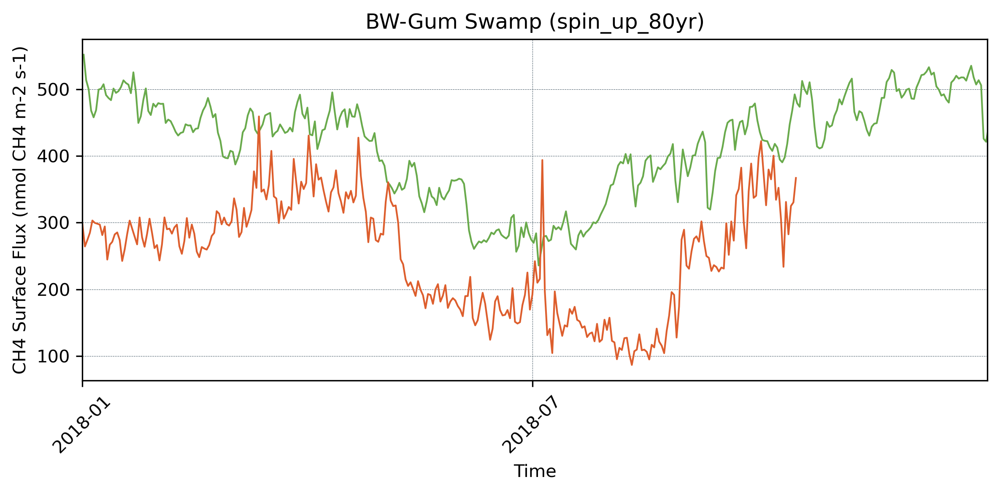

CH4 Surface Flux
站点 BW-Nxr 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


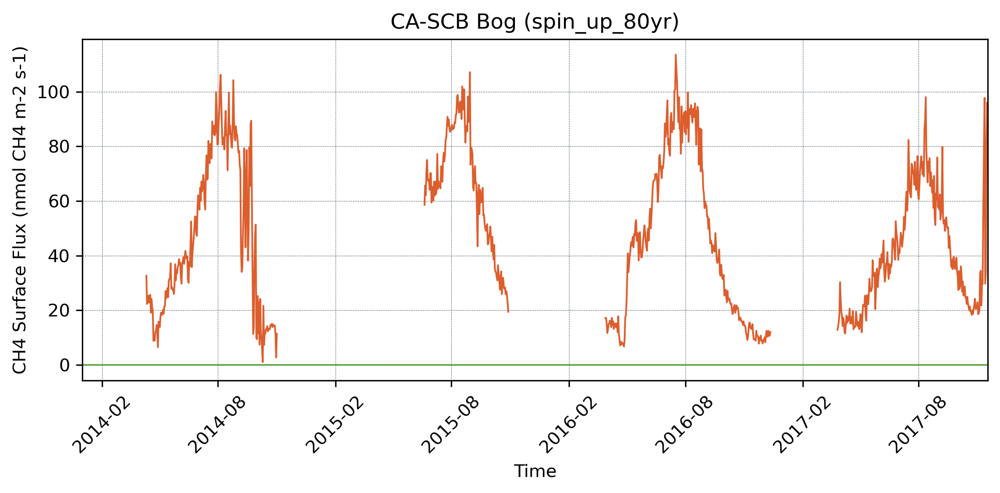

CH4 Surface Flux
站点 CA-SCC 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 CH-Cha 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 CH-Dav 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 CH-Oe2 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 CN-Hgu 异常: data1 全为 0 或 NaN, 跳过绘制
执行异常: [Errno 2] No such file or directory: '/share/home/dq076/data/cases/site/FLUXNET-CH4/spin_up_80yr/DE-Dgw/postdata/DE-Dgw_hist_2015-2018.nc'
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2011-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2011-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


/tmp/ipykernel_2464582/4133243204.py:87: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


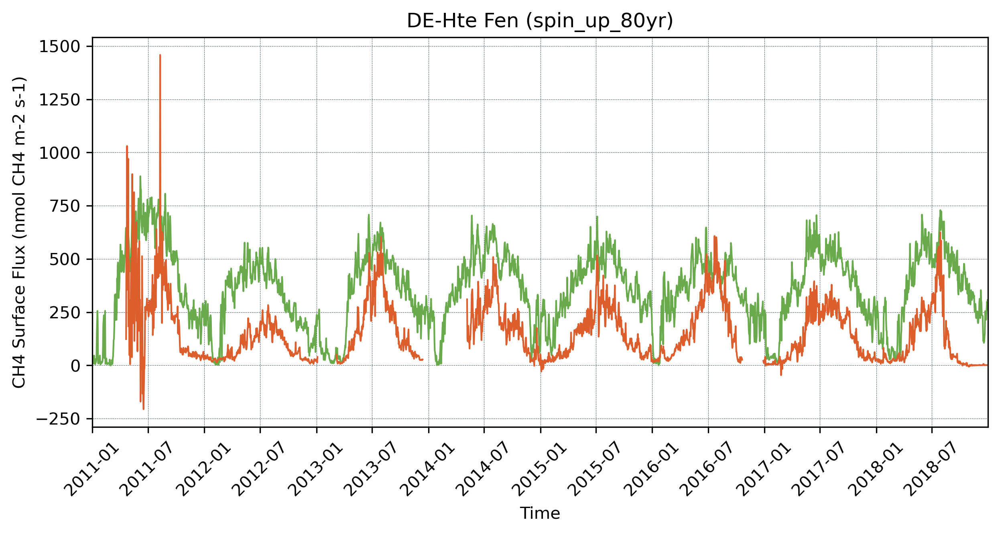

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2012-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2012-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


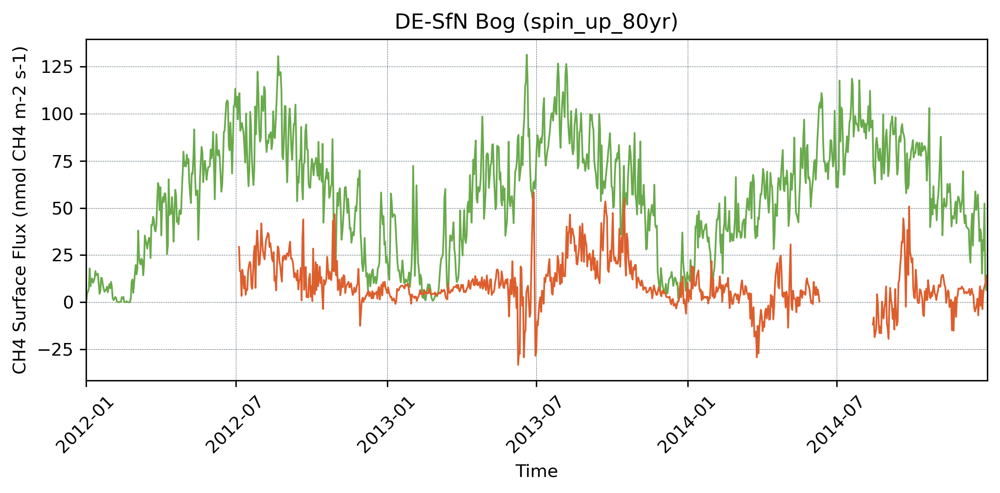

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


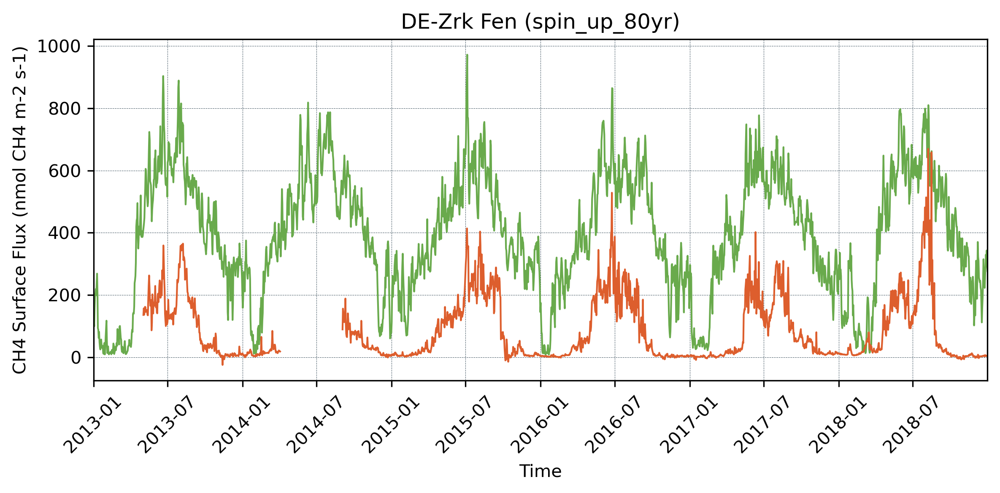

CH4 Surface Flux
站点 FI-Hyy 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2006-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2006-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


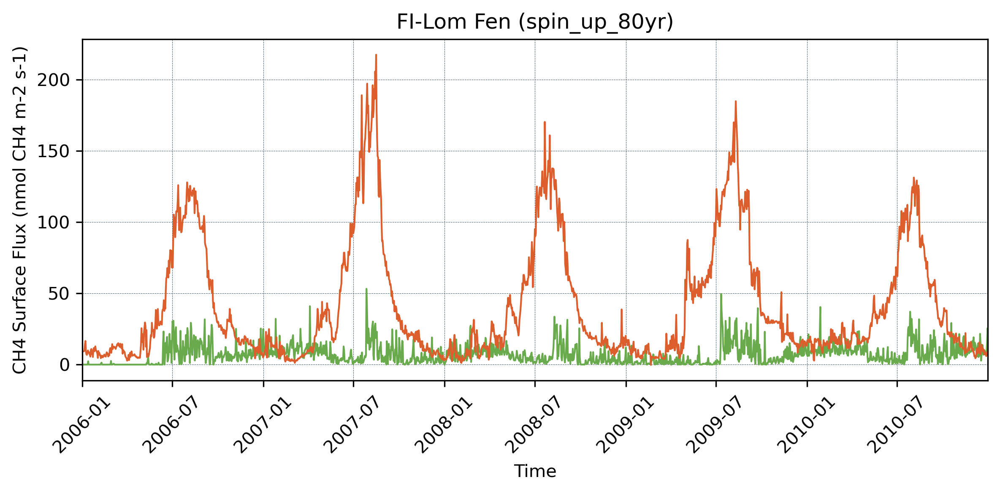

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2012-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2012-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


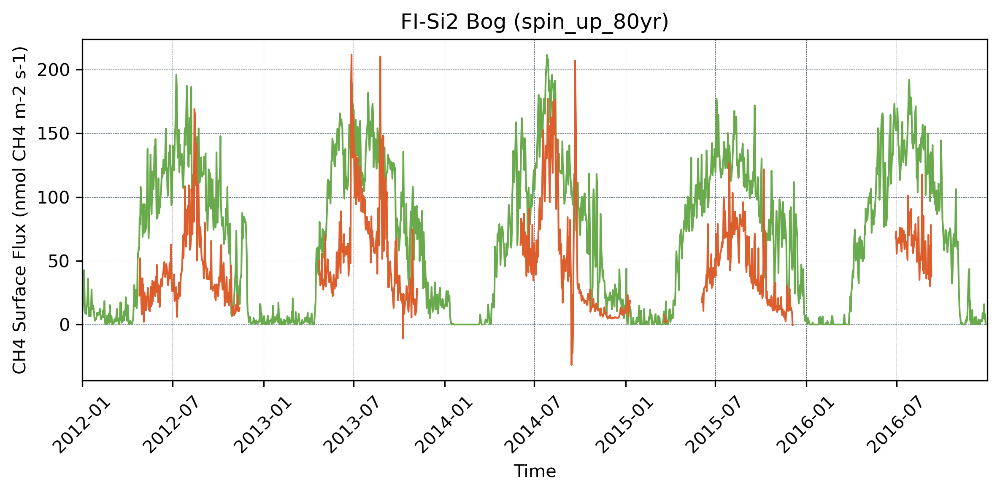

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


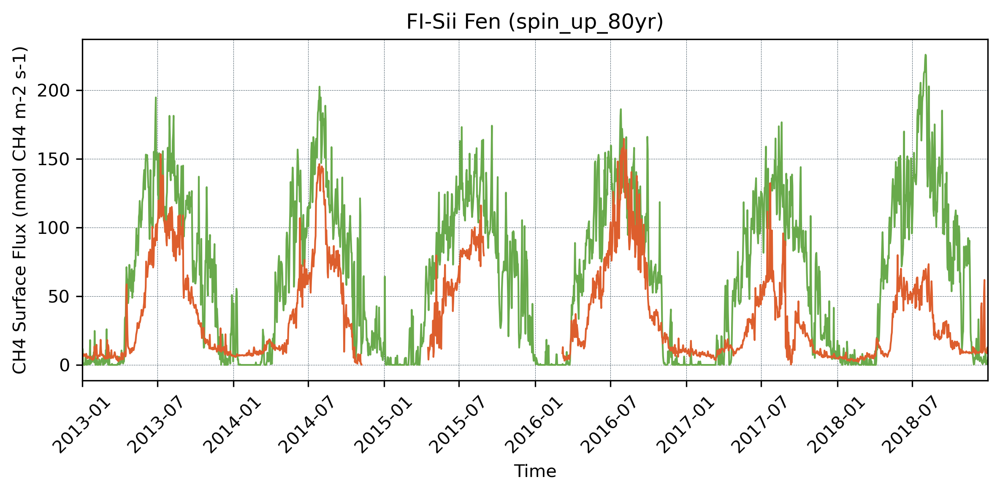

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2017-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2017-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


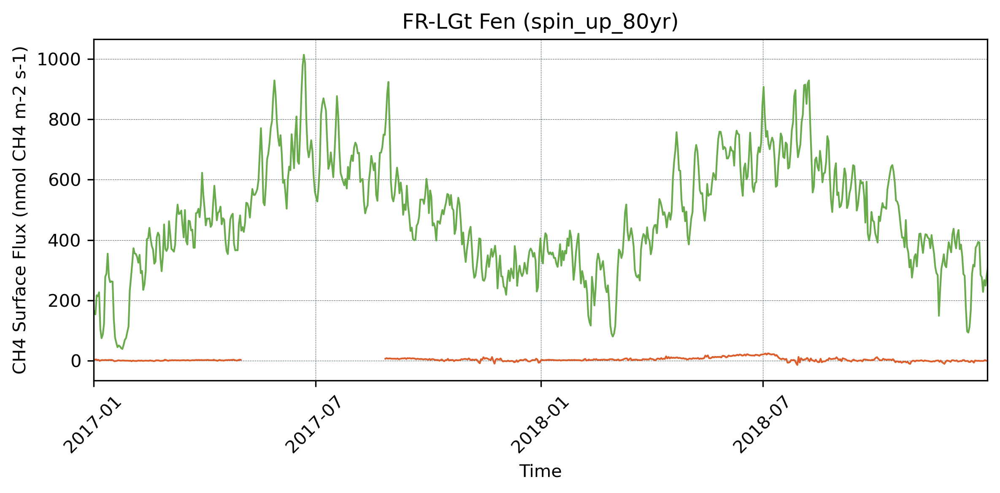

执行异常: [Errno 2] No such file or directory: '/share/home/dq076/data/cases/site/FLUXNET-CH4/spin_up_80yr/HK-MPM/postdata/HK-MPM_hist_2016-2018.nc'
CH4 Surface Flux
站点 ID-Pag 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 IT-BCi 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 IT-Cas 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2015-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2015-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


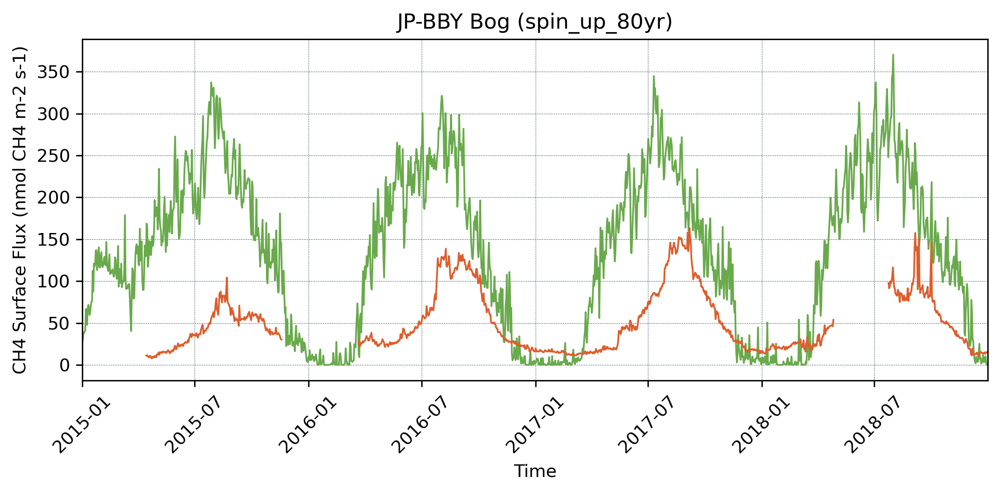

CH4 Surface Flux
站点 JP-Mse 异常: data1 全为 0 或 NaN, 跳过绘制
执行异常: [Errno 2] No such file or directory: '/share/home/dq076/data/cases/site/FLUXNET-CH4/spin_up_80yr/JP-SwL/postdata/JP-SwL_hist_2016-2016.nc'
CH4 Surface Flux
站点 KR-CRK 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 MY-MLM 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 NL-Hor 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 NZ-Kop 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 PH-RiF 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


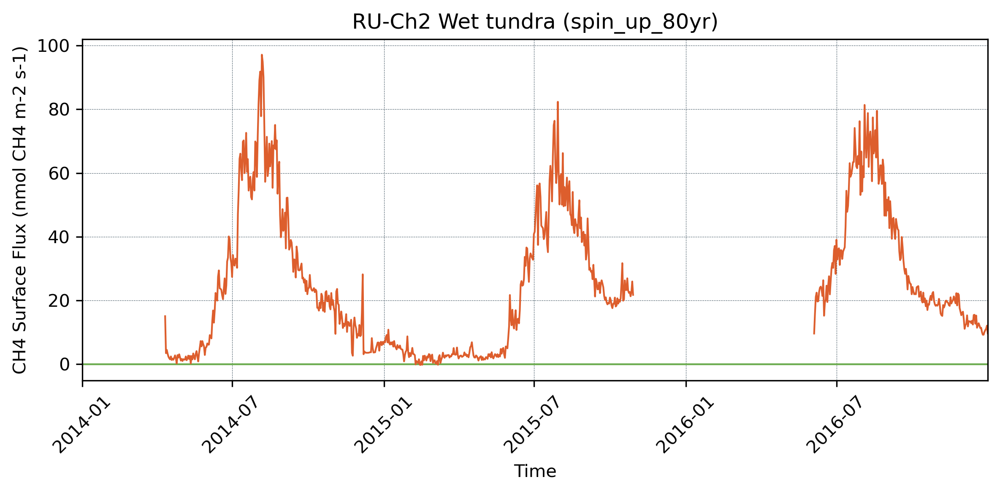

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


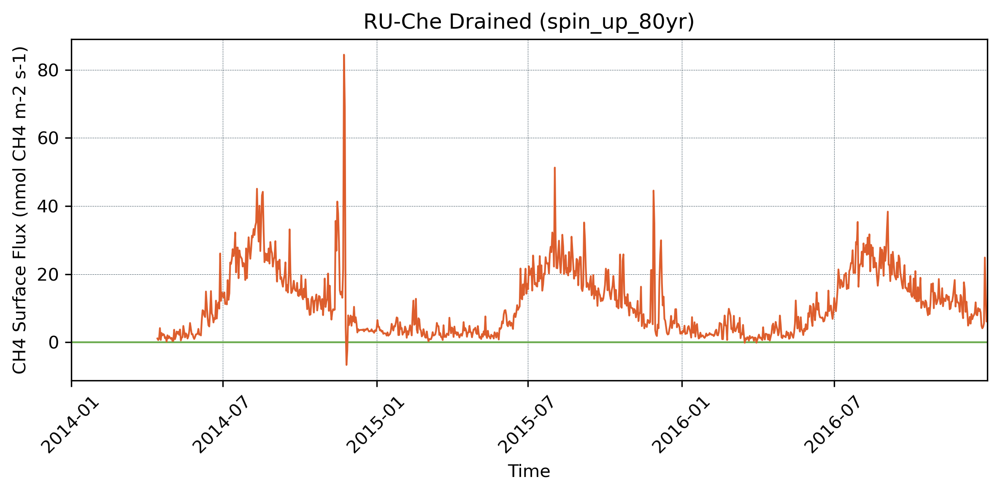

CH4 Surface Flux
站点 RU-Cok 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 RU-Fy2 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 SE-Deg 异常: data1 全为 0 或 NaN, 跳过绘制
执行异常: [Errno 2] No such file or directory: '/share/home/dq076/data/cases/site/FLUXNET-CH4/spin_up_80yr/UK-LBT/postdata/UK-LBT_hist_2011-2014.nc'
CH4 Surface Flux
站点 US-A03 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-A10 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


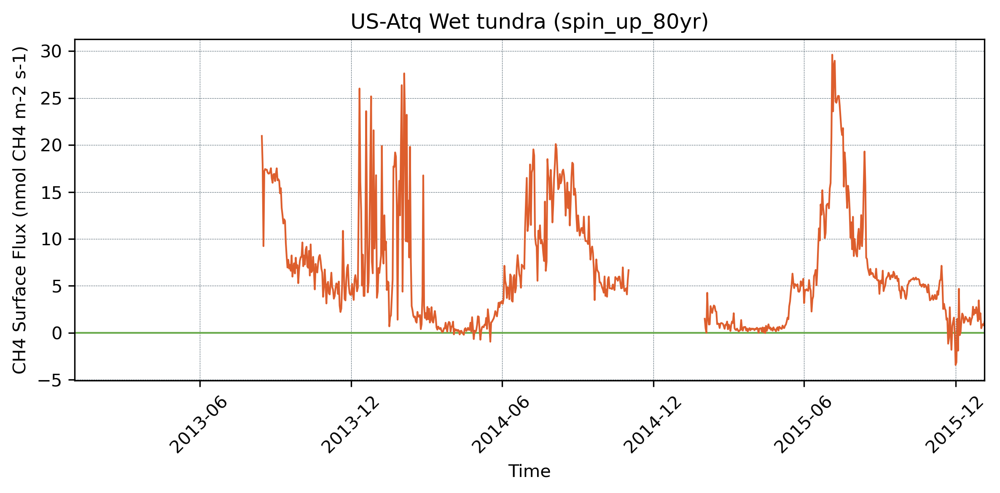

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


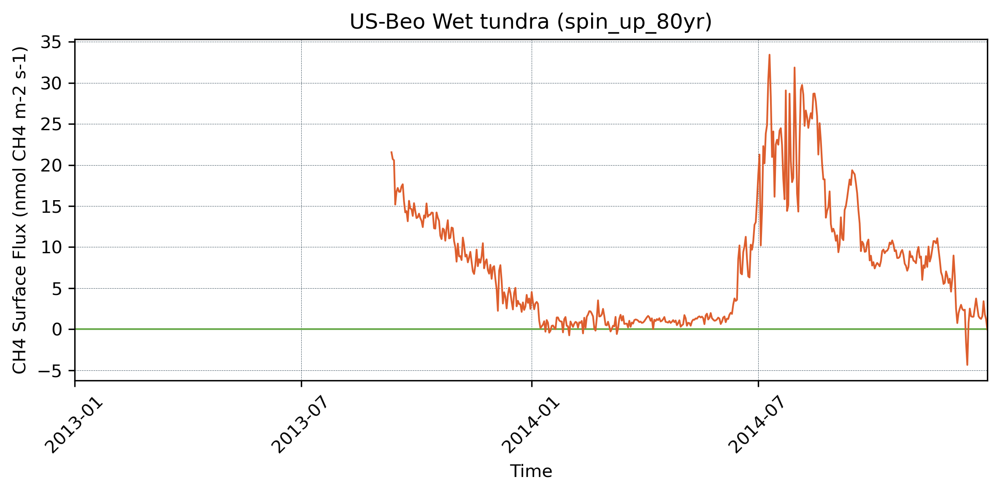

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


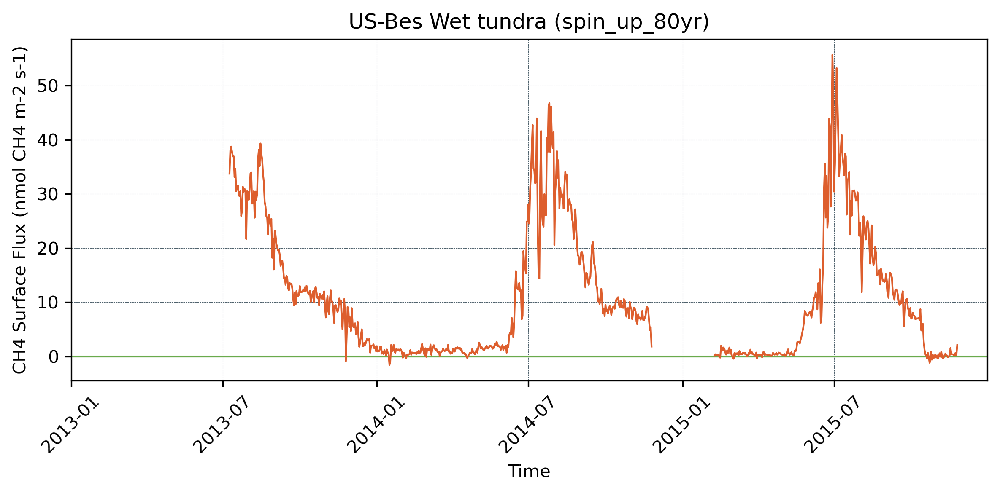

CH4 Surface Flux
站点 US-Bi1 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-Bi2 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


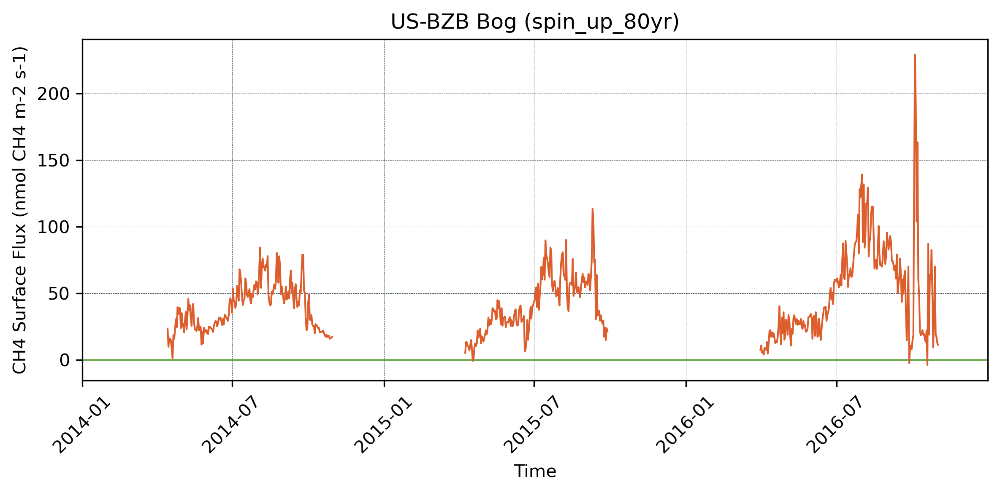

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


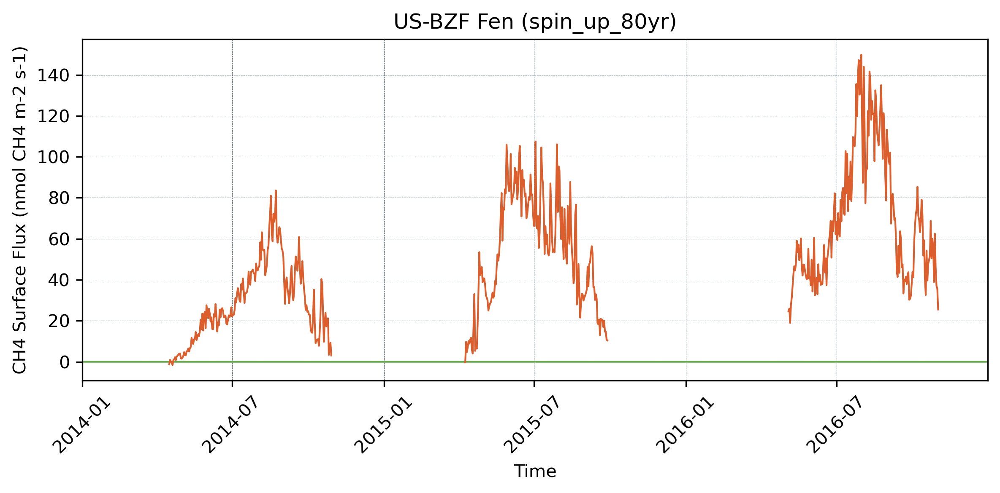

CH4 Surface Flux
站点 US-BZS 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-CRT 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


/tmp/ipykernel_2464582/4133243204.py:87: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


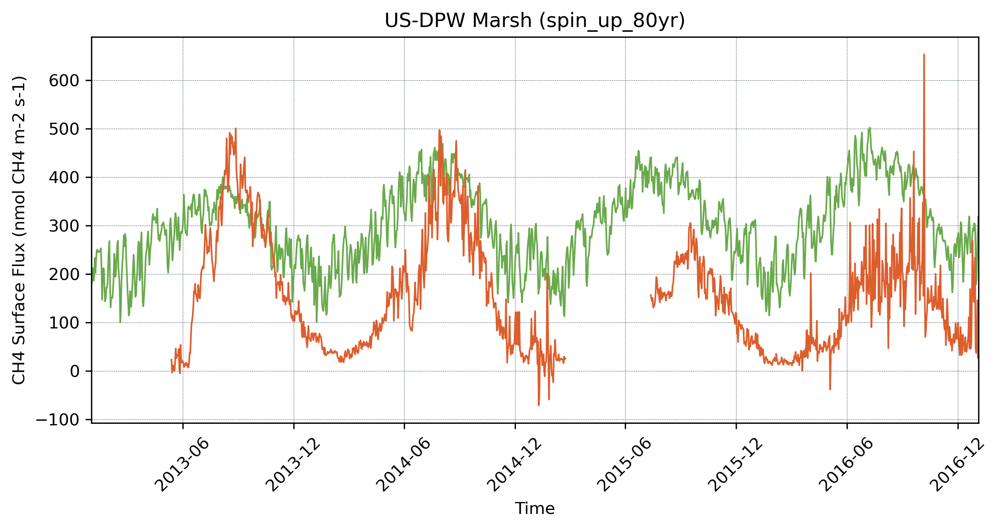

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2018-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2018-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


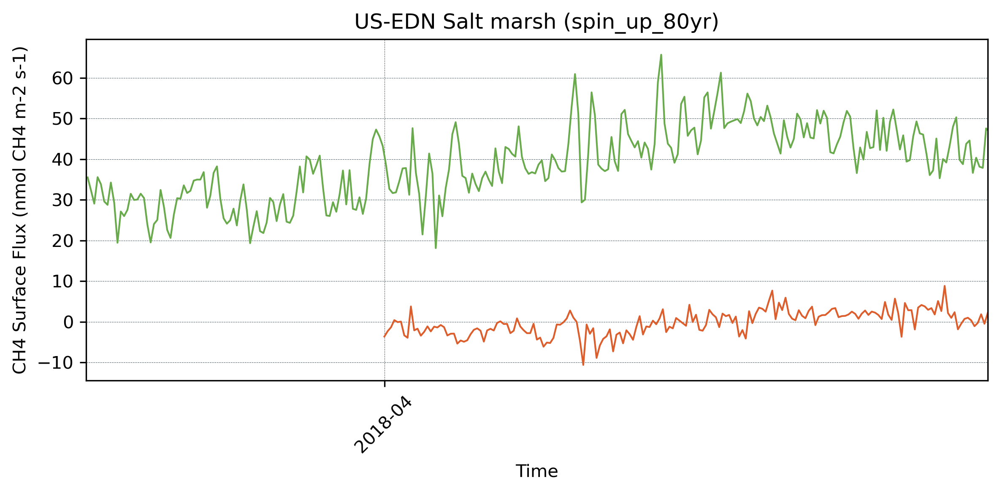

CH4 Surface Flux
站点 US-EML 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-Ho1 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-HRA 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-HRC 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-02T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-02
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


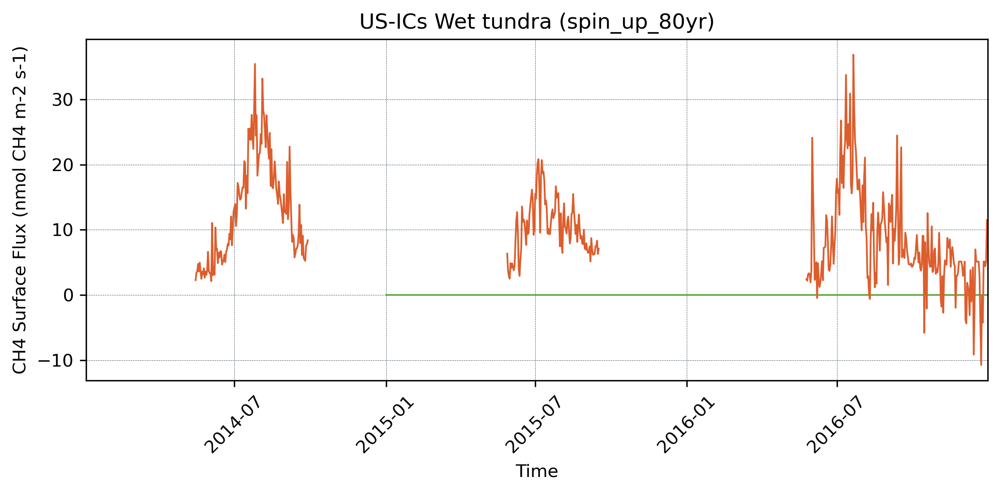

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


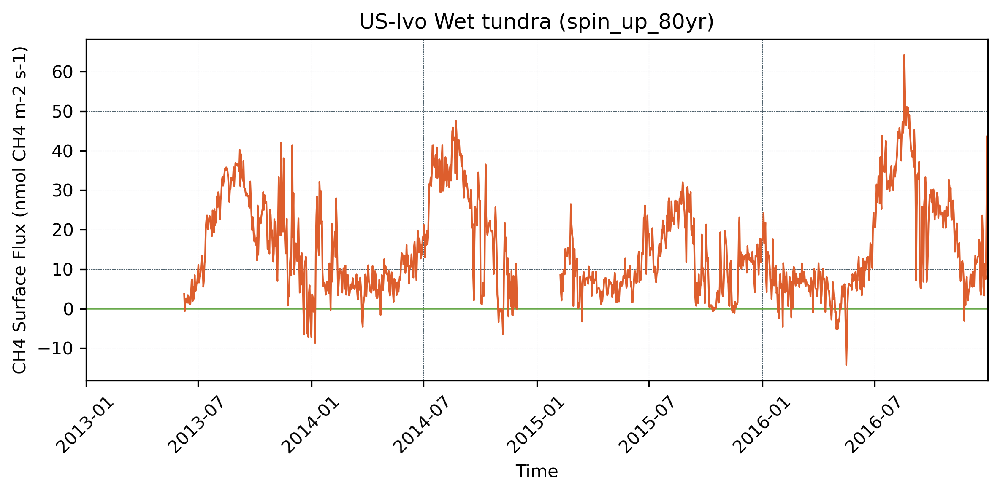

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2011-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2011-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


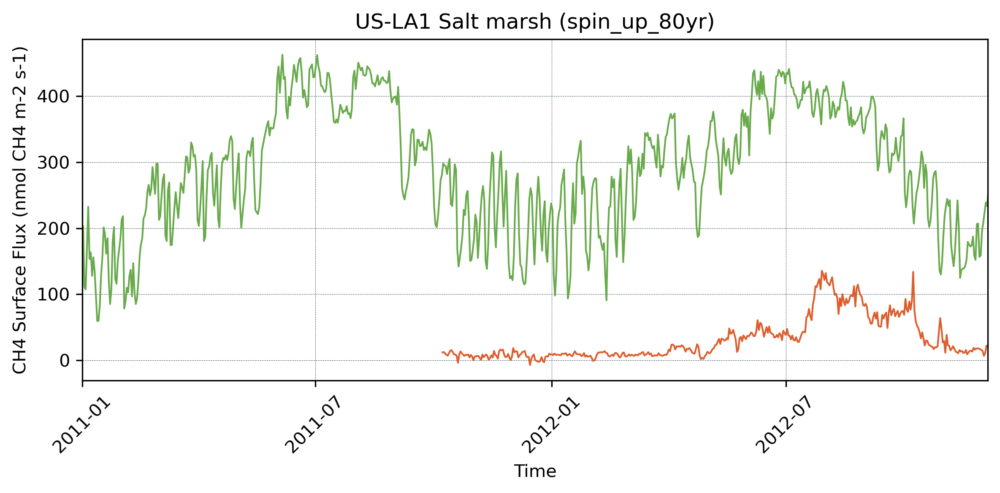

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2011-12-16T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2011-12-16
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


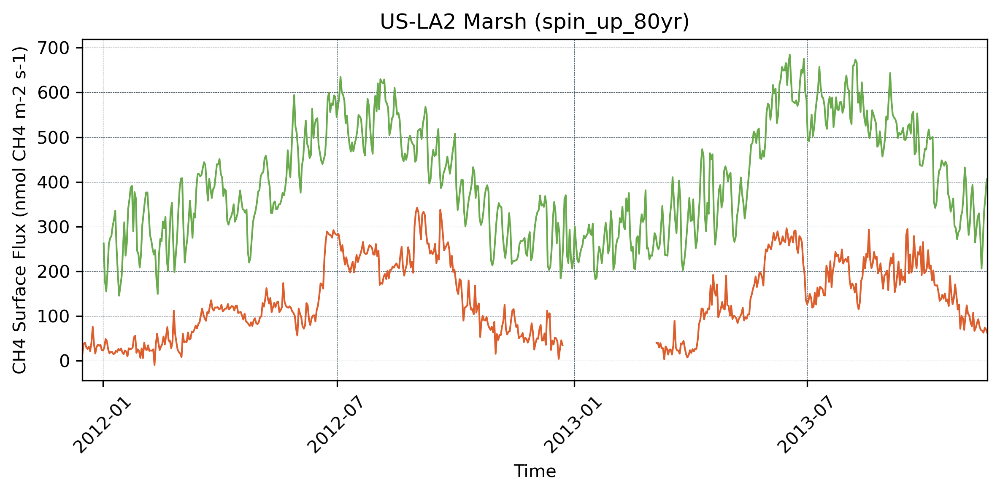

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


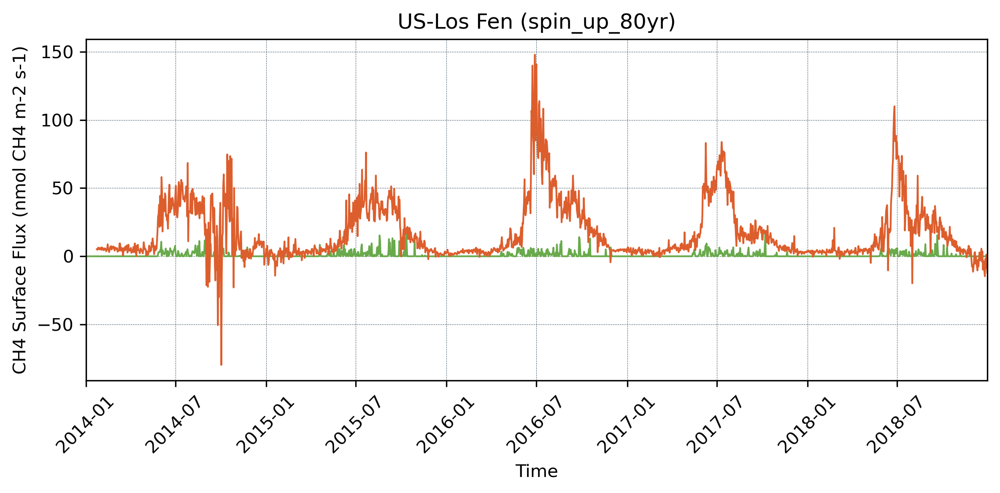

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-04-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-04-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


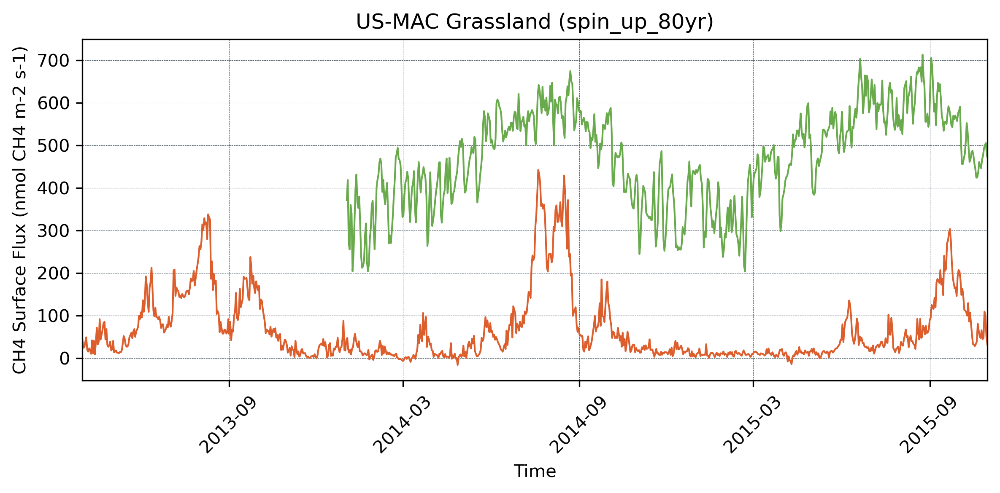

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2012-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2012-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


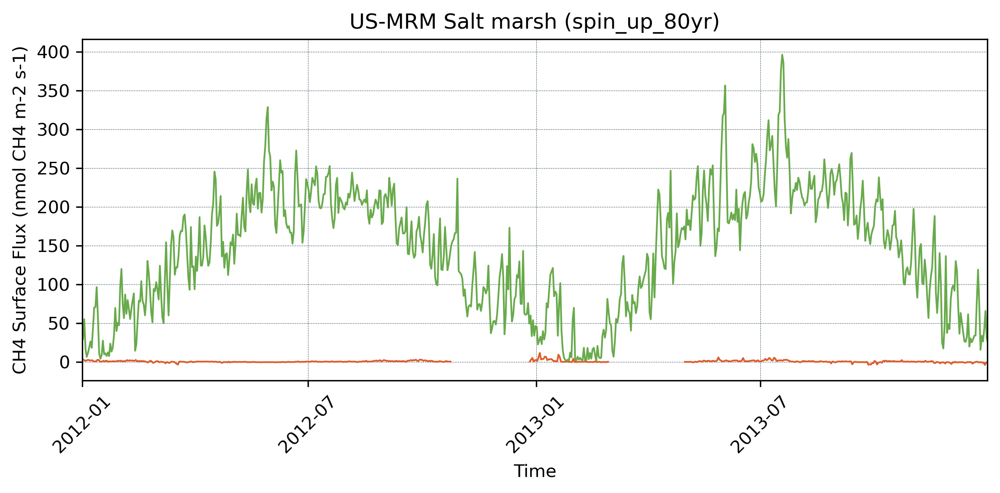

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2010-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2010-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


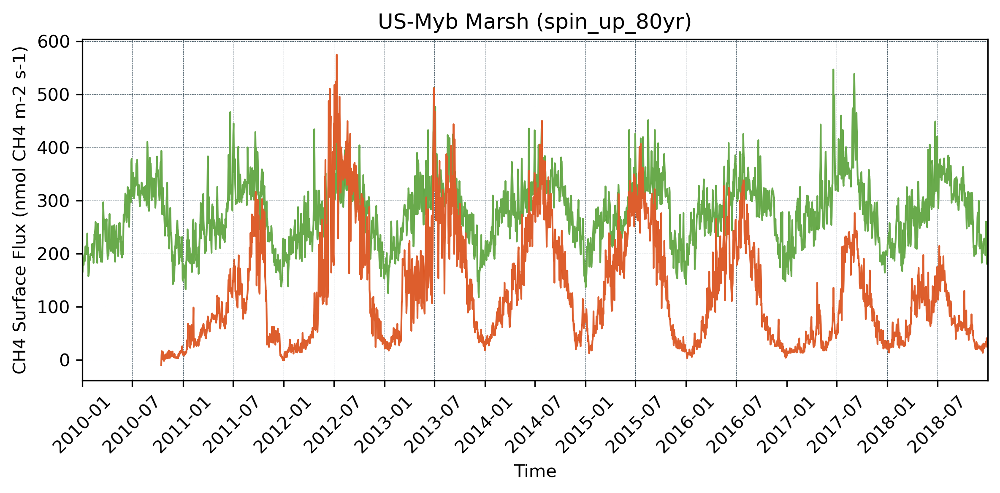

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2012-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2012-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


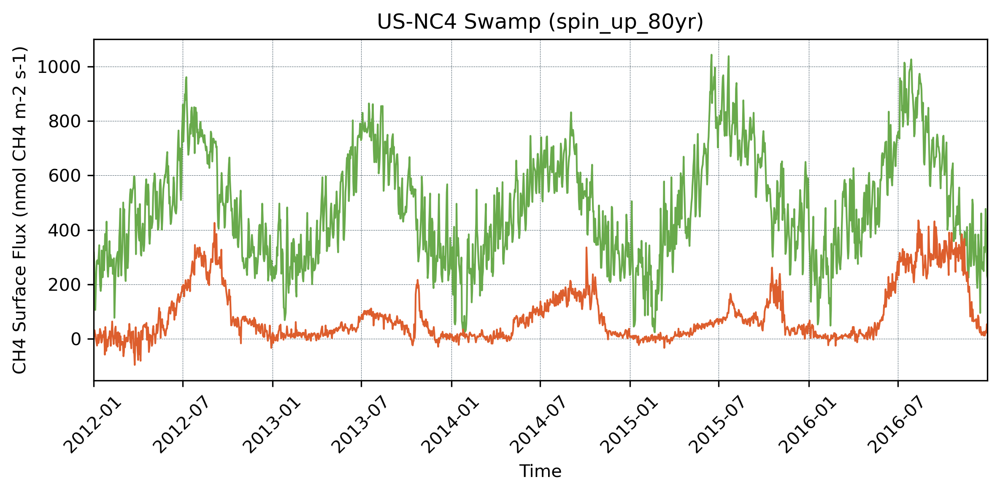

执行异常: [Errno 2] No such file or directory: '/share/home/dq076/data/cases/site/FLUXNET-CH4/spin_up_80yr/US-NGB/postdata/US-NGB_hist_2012-2018.nc'
CH4 Surface Flux
站点 US-NGC 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2011-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2011-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


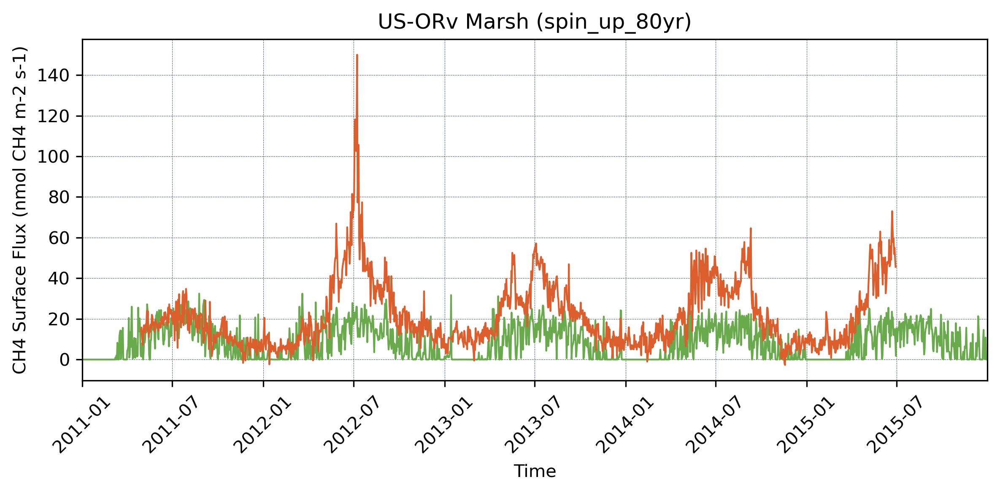

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2015-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2015-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


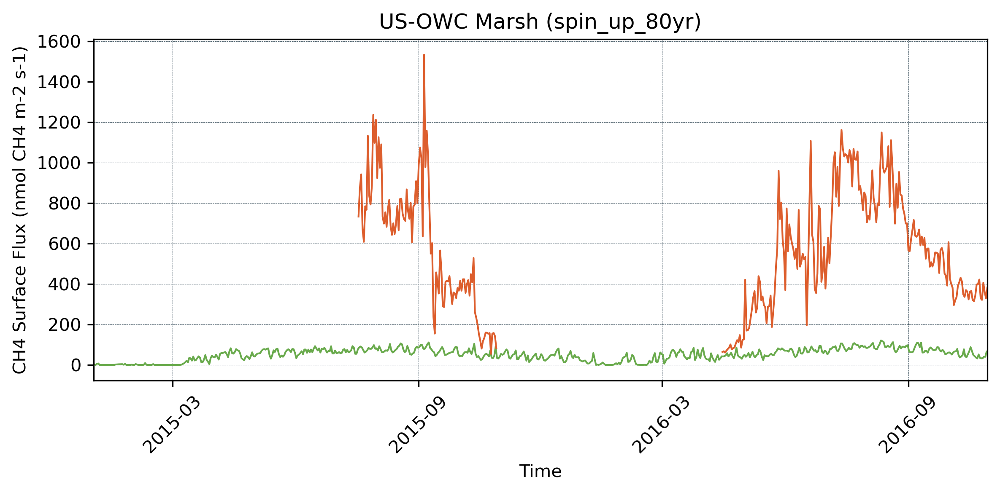

CH4 Surface Flux
站点 US-Pfa 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-Snd 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-Sne 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2014-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2014-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


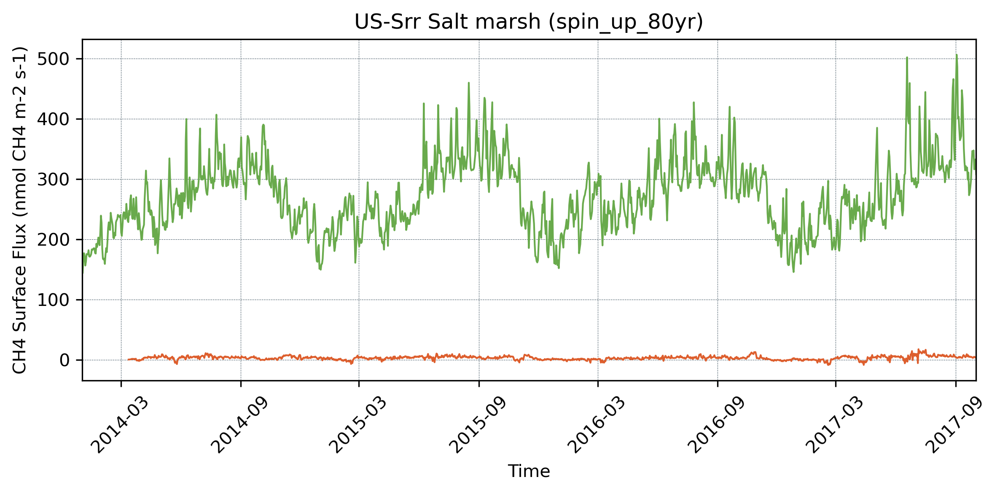

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2016-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2016-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


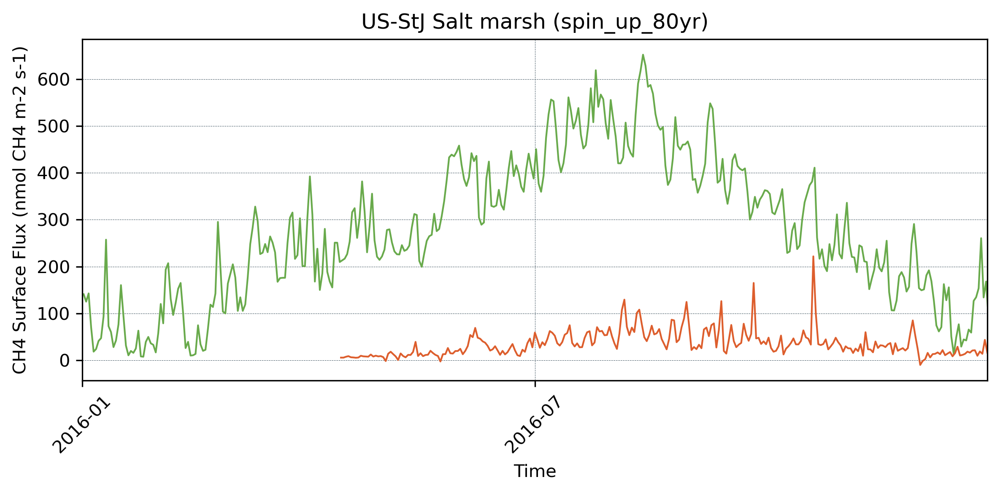

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2011-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2011-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


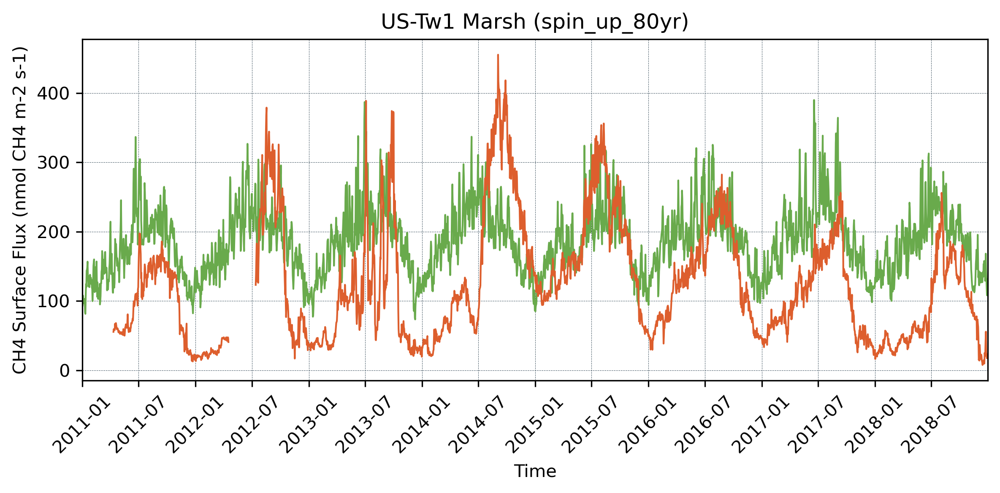

CH4 Surface Flux
站点 US-Tw3 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2013-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2013-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


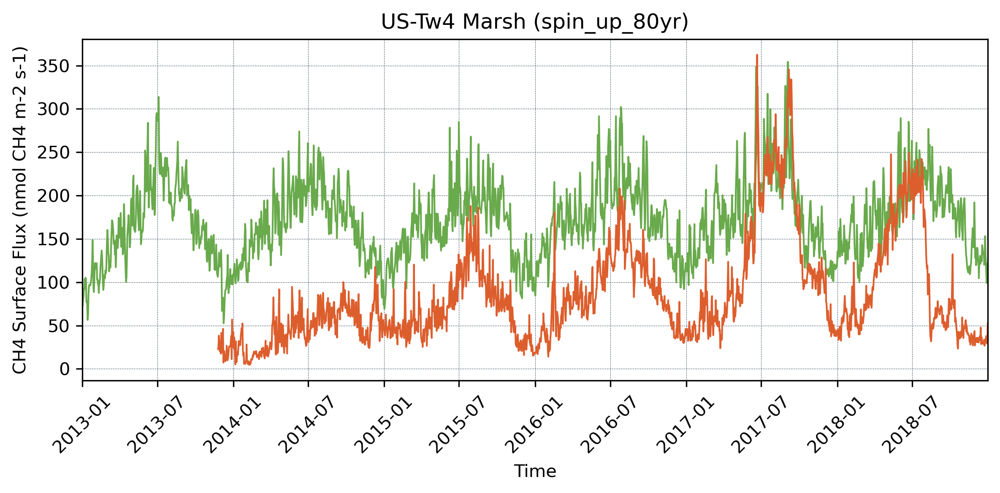

CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2018-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2018-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


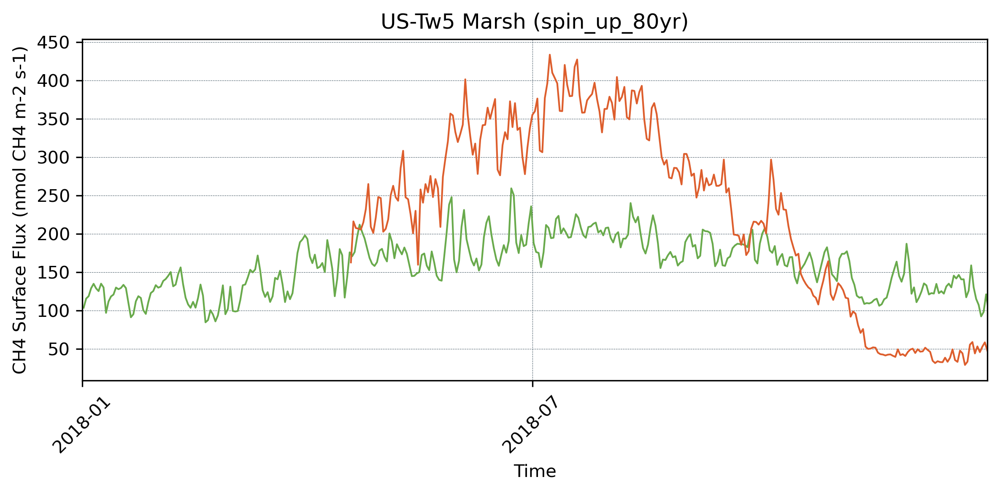

CH4 Surface Flux
站点 US-Twt 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
站点 US-Uaf 异常: data1 全为 0 或 NaN, 跳过绘制
CH4 Surface Flux
<xarray.DataArray 'time' ()> Size: 8B
array('2011-01-01T00:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 8B 2011-01-01
    x        float64 8B 1.0
    y        float64 8B 1.0
Attributes:
    standard_name:  time
    long_name:      time


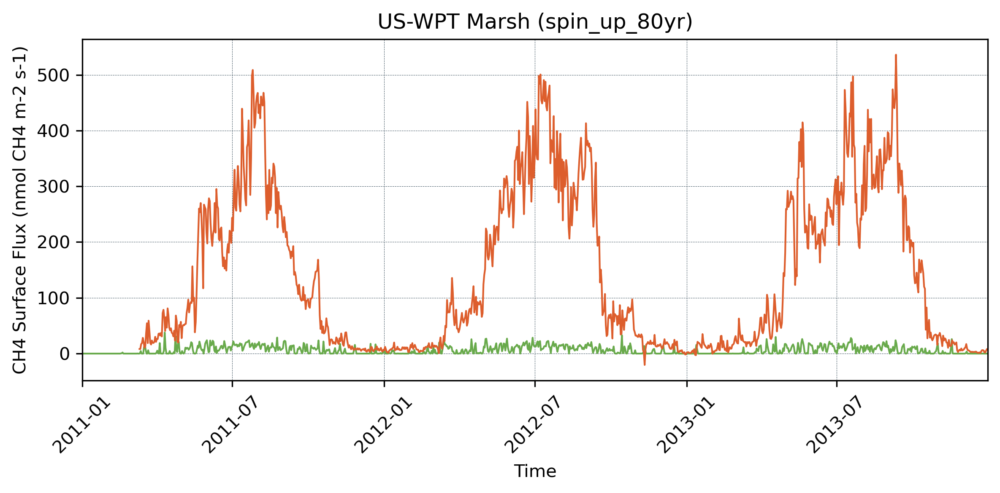

In [ ]:
%matplotlib inline

import geopandas as gpd
from pylab import rcParams
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.dates import MonthLocator, DateFormatter
import numpy as np
import pandas as pd

stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
station_lists = pd.read_csv(stnlist, header=0)
station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
mode = 'spin_up_80yr'
forcing = 'FLUXNET-CH4'
# siteid = 'BW-Gum' 
# yrstt = 2018
# yrend = 2018

for i in range(station_lists.shape[0]):
    try:
        station_list = station_lists.iloc[i]
        siteid = station_list['SITE_ID']
        yrstt = station_list['YEAR_START']
        yrend = station_list['YEAR_END']
        pfttyp = station_list['SITE_CLASSIFICATION']
        if pfttyp == 'Upland' or pfttyp == 'Drained' and isinstance(station_list['UPLAND_CLASS'], str):
            pfttyp = station_list['UPLAND_CLASS']

        var = 'ch4_surf_flux_tot'
        var1 = {'ch4_surf_flux_tot':'f_ch4_surf_flux_tot'}
        trans = {'ch4_surf_flux_tot':1/16e6}
        var2 = {'ch4_surf_flux_tot':'FCH4_F'}
        title = {'ch4_surf_flux_tot':'CH4 Surface Flux'}
        ytitle = title
        unit = {'ch4_surf_flux_tot':'nmol CH4 m-2 s-1'}
        path1 = f'/share/home/dq076/data/cases/site/{forcing}/{mode}/{siteid}/postdata/'
        path2 = f'/share/home/dq076/data/ME/FLUXNET-CH4/FLX_{siteid}_FLUXNET-CH4_{yrstt}-{yrend}_1-1/'

        label = ['CoLM','FLUXNET-CH4']
        color = ["#69aa4c","#dd5e2d"]

        data1 = xr.open_dataset(f'{path1}{siteid}_hist_{yrstt}-{yrend}.nc')
        data2 = xr.open_dataset(f'{path2}{siteid}_FLUXNET-CH4_DD.nc')
        # print(data1)
        # print(data2)
        data1 = data1[var1[var]][:,0]*6.25e7
        data2 = data2[var2[var]][:,0,0]
        x = data2['time']
        print(title[var])

        # 检查 data1 是否全为 0 或 NaN
        data1_values = data1.values
        if np.all((np.isnan(data1_values) | (data1_values == 0))):
            print(f"站点 {siteid} 异常: data1 全为 0 或 NaN, 跳过绘制")
            continue

        fig = plt.figure(figsize=(8, 4), dpi=300)
        fig.subplots_adjust(left=0.05, right=0.98, 
                        bottom=0.14, top=0.95, hspace=0.8) 
        gs = GridSpec(2, 48)
        ax = fig.add_subplot(gs[:, :])
        ax.grid(ls = "--", lw = 0.25, color = "#4E616C")
        ax.plot(data1['time'], data1, mfc = "white",lw = 1, ms = 2, color = color[0], label=label[0])
        ax.plot(data2['time'], data2, mfc = "white",lw = 1, ms = 2, color = color[1], label=label[1])
        # ax.set_title(f"{siteid} {mode}  {title[var]} ({unit[var]})")
        ax.set_title(f"{siteid} {pfttyp} ({mode})")

        ax.set_xlabel('Time')
        ax.set_ylabel(f"{ytitle[var]} ({unit[var]})")

        ax.xaxis.set_major_locator(MonthLocator(interval=6))
        ax.xaxis.set_major_formatter(DateFormatter('%Y-%m'))
        print(x[0])
        ax.set_xlim(x[0],x[-1])
        ax.tick_params(axis='x', rotation=45)

        plt.tight_layout()
        plt.show()
    except Exception as exc:
            print(f"执行异常: {exc}")